## Exercise 2: Photo Sorting Application 📸

In this exercise, we want to use a model for classifying photos in the `exercise2_images` folder. 

Assume the photos are not tagged/labeled, and you cannot use labeled data.


First, let's load and print some images.

In [1]:
import glob

In [2]:
image_paths = sorted(glob.glob('exercise2_images/*'))

In [3]:
len(image_paths)

47

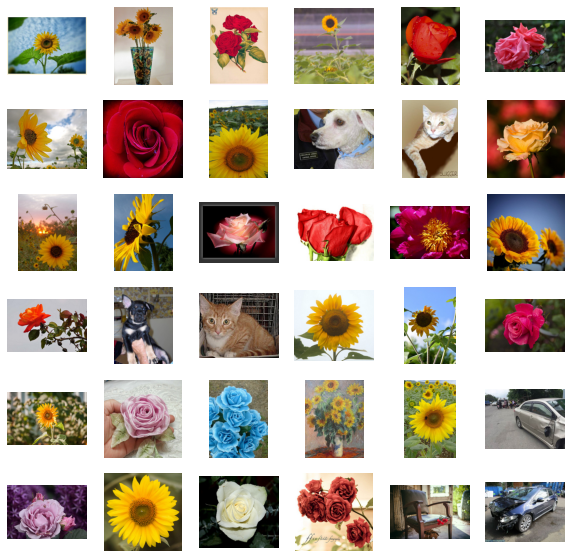

In [4]:
# display grid of images
import matplotlib.pyplot as plt

fig, axes = plt.subplots(6,6, figsize=(10, 10))
for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_paths[i]))
    ax.axis('off')

**a)** First, we want to classify the images into three groups:

* Photos of roses.
* Photos of sunflowers.
* Photos of other things.


For each of the photos, compute its vector representation into a matrix. 
After that, print each photo, and its corresponding classification into the three groups.

In [5]:
import torch
import clip
from PIL import Image

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

In [8]:
# compute the image embeddings
image_features = []

for image_path in image_paths:
    image = preprocess(Image.open(image_path)).unsqueeze(0).to(device)
    with torch.no_grad():
        image_feature = model.encode_image(image)
        image_feature = image_feature / image_feature.norm(dim=-1, keepdim=True)
        image_features.append(image_feature)

image_features = torch.cat(image_features, dim=0)

In [9]:
image_features.shape

torch.Size([47, 512])

In [10]:
labels = ["A photo of a rose", "A photo of a sunflower", "A photo"]
text = clip.tokenize(labels).to(device)

# Calculate features (only for the text, since we have the same image)
with torch.no_grad():
    text_features = model.encode_text(text)

text_features /= text_features.norm(dim=-1, keepdim=True)

# Compute similarity
similarity = image_features @ text_features.T

probabilities = (100.*similarity).softmax(dim=-1)

for image_path in image_paths:
    print(image_path)
    plt.imshow(plt.imread(image_path))
    plt.show()

    for i in range(len(labels)):
        print(f"{labels[i]}: {100* probabilities[image_paths.index(image_path), i].item():.2f}%")

    print()

exercise2_images/imagen100.jpg


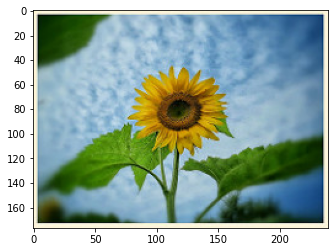

A photo of a rose: 0.02%
A photo of a sunflower: 99.94%
A photo: 0.05%

exercise2_images/imagen101.jpg


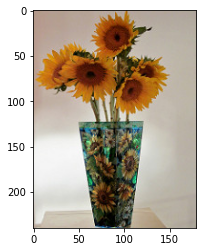

A photo of a rose: 0.01%
A photo of a sunflower: 99.63%
A photo: 0.35%

exercise2_images/imagen124.jpg


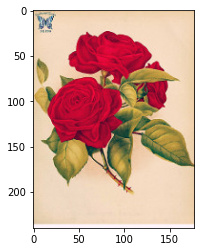

A photo of a rose: 99.87%
A photo of a sunflower: 0.00%
A photo: 0.13%

exercise2_images/imagen139.jpg


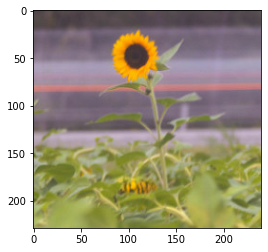

A photo of a rose: 0.05%
A photo of a sunflower: 99.91%
A photo: 0.04%

exercise2_images/imagen140.jpg


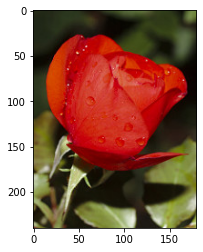

A photo of a rose: 99.76%
A photo of a sunflower: 0.05%
A photo: 0.19%

exercise2_images/imagen152.jpg


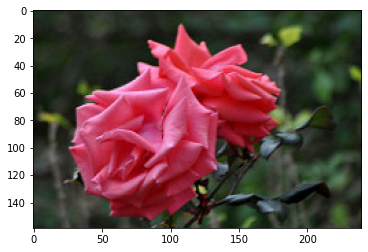

A photo of a rose: 99.73%
A photo of a sunflower: 0.00%
A photo: 0.26%

exercise2_images/imagen155.jpg


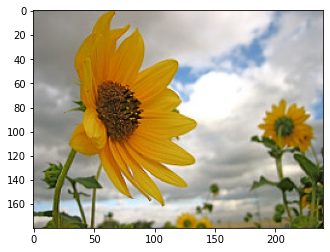

A photo of a rose: 0.02%
A photo of a sunflower: 99.95%
A photo: 0.04%

exercise2_images/imagen158.jpg


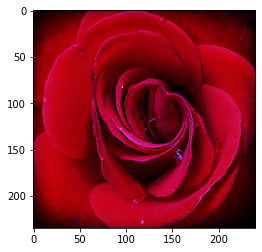

A photo of a rose: 99.95%
A photo of a sunflower: 0.00%
A photo: 0.05%

exercise2_images/imagen159.jpg


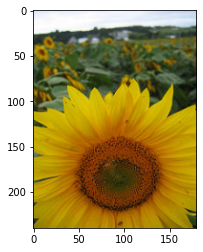

A photo of a rose: 0.01%
A photo of a sunflower: 99.91%
A photo: 0.09%

exercise2_images/imagen177.jpg


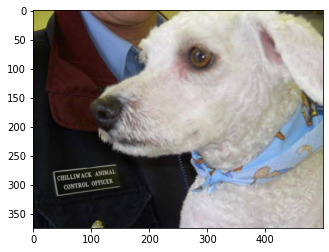

A photo of a rose: 1.65%
A photo of a sunflower: 2.13%
A photo: 96.22%

exercise2_images/imagen18.jpg


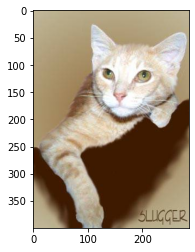

A photo of a rose: 1.39%
A photo of a sunflower: 0.78%
A photo: 97.83%

exercise2_images/imagen181.jpg


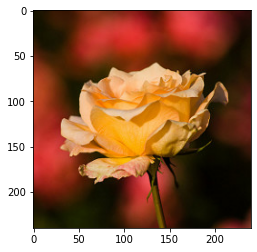

A photo of a rose: 99.81%
A photo of a sunflower: 0.02%
A photo: 0.17%

exercise2_images/imagen182.jpg


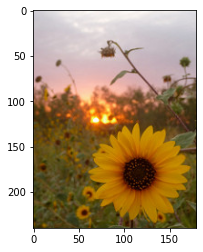

A photo of a rose: 0.08%
A photo of a sunflower: 99.52%
A photo: 0.40%

exercise2_images/imagen183.jpg


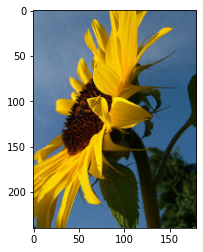

A photo of a rose: 0.01%
A photo of a sunflower: 99.93%
A photo: 0.05%

exercise2_images/imagen184.jpg


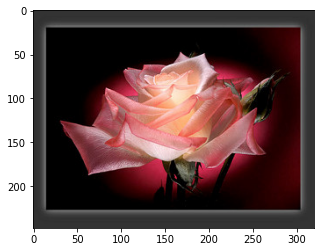

A photo of a rose: 99.51%
A photo of a sunflower: 0.04%
A photo: 0.45%

exercise2_images/imagen185.jpg


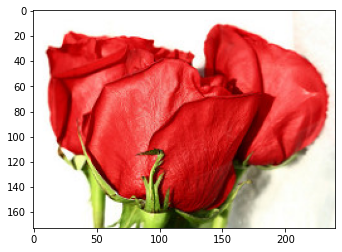

A photo of a rose: 98.66%
A photo of a sunflower: 0.01%
A photo: 1.33%

exercise2_images/imagen186.jpg


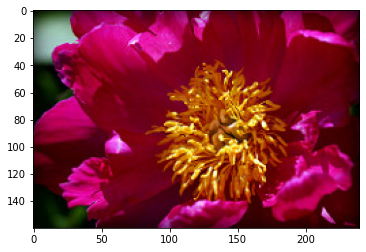

A photo of a rose: 95.25%
A photo of a sunflower: 0.68%
A photo: 4.07%

exercise2_images/imagen196.jpg


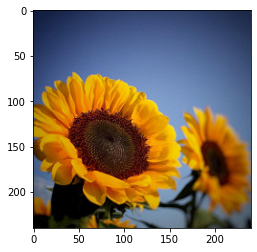

A photo of a rose: 0.07%
A photo of a sunflower: 99.72%
A photo: 0.21%

exercise2_images/imagen197.jpg


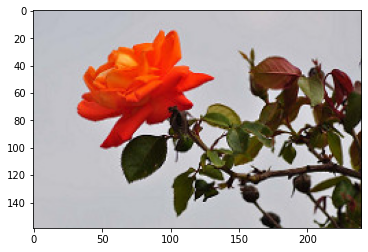

A photo of a rose: 99.32%
A photo of a sunflower: 0.02%
A photo: 0.65%

exercise2_images/imagen200.jpg


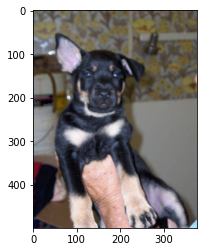

A photo of a rose: 3.77%
A photo of a sunflower: 0.82%
A photo: 95.40%

exercise2_images/imagen201.jpg


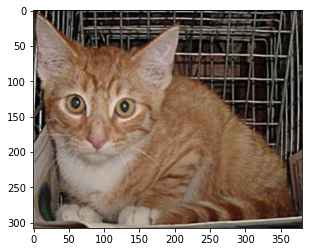

A photo of a rose: 0.64%
A photo of a sunflower: 0.78%
A photo: 98.58%

exercise2_images/imagen203.jpg


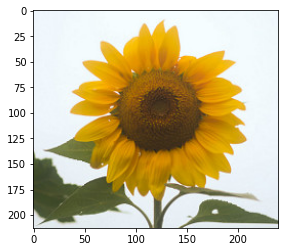

A photo of a rose: 0.01%
A photo of a sunflower: 99.98%
A photo: 0.01%

exercise2_images/imagen204.jpg


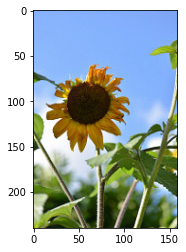

A photo of a rose: 0.01%
A photo of a sunflower: 99.94%
A photo: 0.05%

exercise2_images/imagen213.jpg


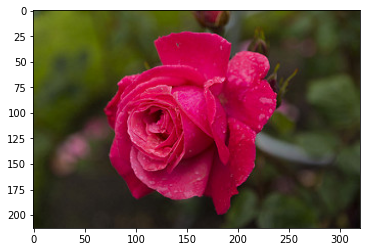

A photo of a rose: 99.89%
A photo of a sunflower: 0.00%
A photo: 0.11%

exercise2_images/imagen220.jpg


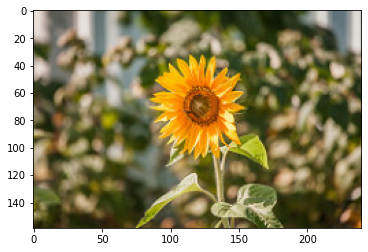

A photo of a rose: 0.05%
A photo of a sunflower: 99.92%
A photo: 0.02%

exercise2_images/imagen260.jpg


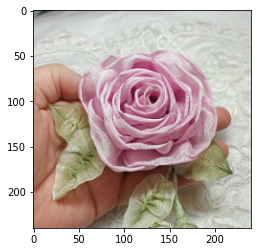

A photo of a rose: 99.43%
A photo of a sunflower: 0.01%
A photo: 0.57%

exercise2_images/imagen261.jpg


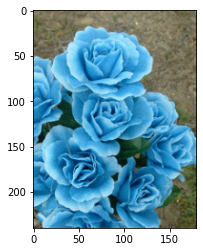

A photo of a rose: 98.11%
A photo of a sunflower: 0.02%
A photo: 1.87%

exercise2_images/imagen266.jpg


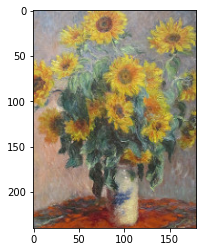

A photo of a rose: 0.05%
A photo of a sunflower: 98.95%
A photo: 0.99%

exercise2_images/imagen270.jpg


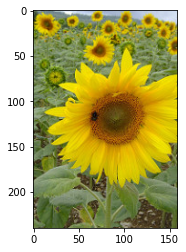

A photo of a rose: 0.00%
A photo of a sunflower: 99.97%
A photo: 0.03%

exercise2_images/imagen292.jpeg


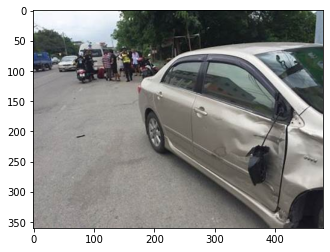

A photo of a rose: 3.55%
A photo of a sunflower: 5.16%
A photo: 91.29%

exercise2_images/imagen376.jpg


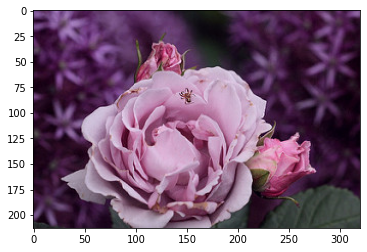

A photo of a rose: 97.36%
A photo of a sunflower: 0.01%
A photo: 2.63%

exercise2_images/imagen379.jpg


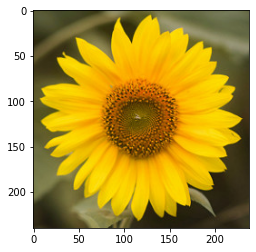

A photo of a rose: 0.00%
A photo of a sunflower: 99.99%
A photo: 0.01%

exercise2_images/imagen382.jpg


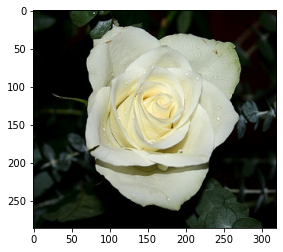

A photo of a rose: 99.59%
A photo of a sunflower: 0.02%
A photo: 0.39%

exercise2_images/imagen484.jpg


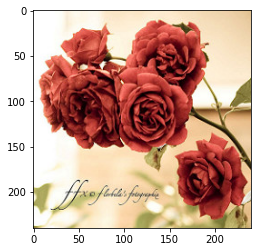

A photo of a rose: 95.86%
A photo of a sunflower: 0.02%
A photo: 4.12%

exercise2_images/imagen558.jpg


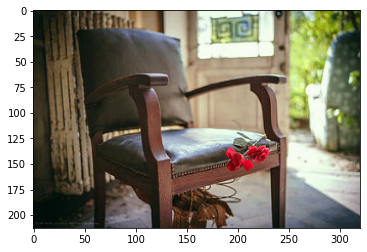

A photo of a rose: 90.88%
A photo of a sunflower: 0.14%
A photo: 8.98%

exercise2_images/imagen594.jpg


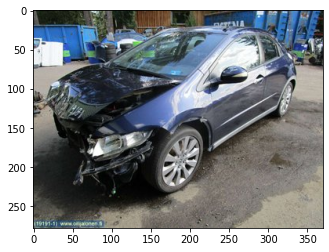

A photo of a rose: 0.72%
A photo of a sunflower: 0.86%
A photo: 98.43%

exercise2_images/imagen748.jpg


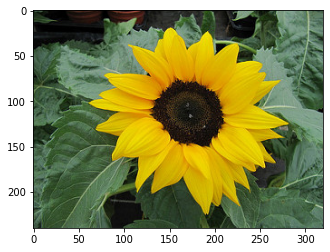

A photo of a rose: 0.00%
A photo of a sunflower: 99.99%
A photo: 0.01%

exercise2_images/imagen750.jpg


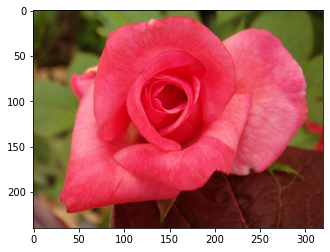

A photo of a rose: 99.77%
A photo of a sunflower: 0.00%
A photo: 0.22%

exercise2_images/imagen754.jpg


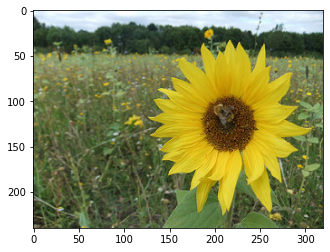

A photo of a rose: 0.00%
A photo of a sunflower: 99.94%
A photo: 0.06%

exercise2_images/imagen755.jpg


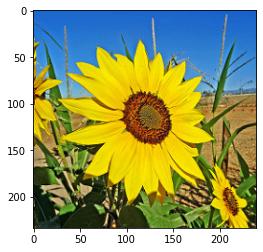

A photo of a rose: 0.00%
A photo of a sunflower: 99.96%
A photo: 0.04%

exercise2_images/imagen763.jpg


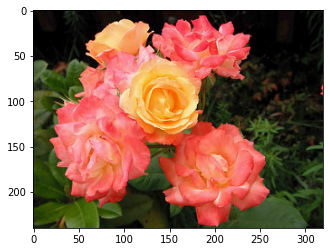

A photo of a rose: 99.18%
A photo of a sunflower: 0.01%
A photo: 0.81%

exercise2_images/imagen911.jpg


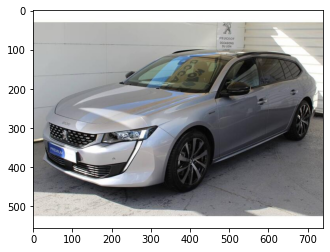

A photo of a rose: 0.76%
A photo of a sunflower: 0.13%
A photo: 99.12%

exercise2_images/imagen941.jpg


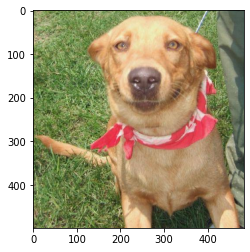

A photo of a rose: 8.11%
A photo of a sunflower: 30.35%
A photo: 61.54%

exercise2_images/imagen993.jpg


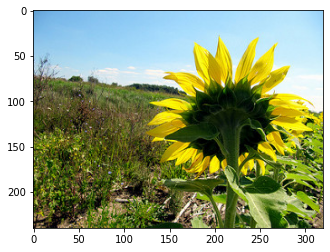

A photo of a rose: 0.00%
A photo of a sunflower: 99.87%
A photo: 0.13%

exercise2_images/imagen994.jpg


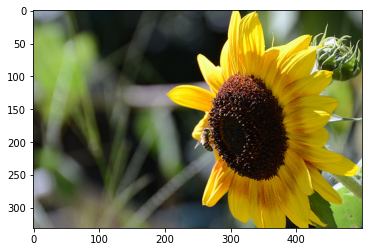

A photo of a rose: 0.03%
A photo of a sunflower: 99.86%
A photo: 0.11%

exercise2_images/imagen995.jpeg


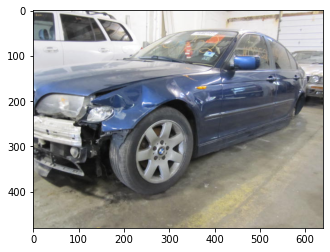

A photo of a rose: 1.87%
A photo of a sunflower: 1.34%
A photo: 96.79%

exercise2_images/imagen996.jpg


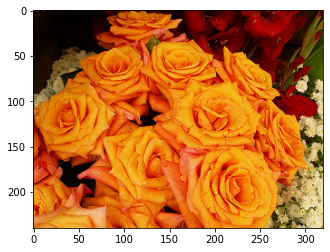

A photo of a rose: 93.82%
A photo of a sunflower: 1.64%
A photo: 4.54%



In [13]:
for image_path in image_paths:
    print(image_path)
    plt.imshow(plt.imread(image_path))
    plt.show()

    for i in range(len(labels)):
        print(f"{labels[i]}: {100* probabilities[image_paths.index(image_path), i].item():.2f}%")

    print()

**b)** Let's say now we want to classify the same images into two groups:

* Photos of cars.
* The rest of the photos.

Do only the minimum changes to the previous code, and again, for each photo print the new classification.

exercise2_images/imagen100.jpg


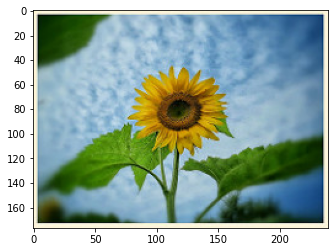

A photo of a car: 1.61%
A photo: 98.39%

exercise2_images/imagen101.jpg


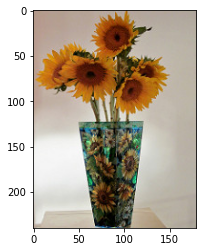

A photo of a car: 0.26%
A photo: 99.74%

exercise2_images/imagen124.jpg


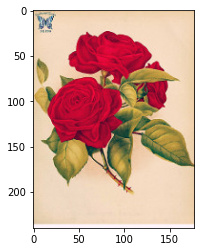

A photo of a car: 0.59%
A photo: 99.41%

exercise2_images/imagen139.jpg


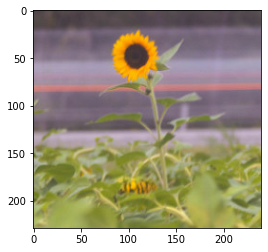

A photo of a car: 5.51%
A photo: 94.49%

exercise2_images/imagen140.jpg


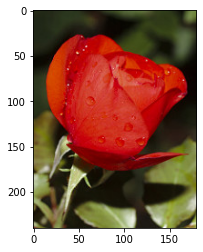

A photo of a car: 1.51%
A photo: 98.49%

exercise2_images/imagen152.jpg


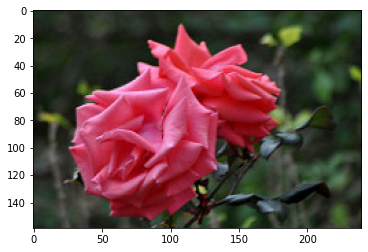

A photo of a car: 0.50%
A photo: 99.50%

exercise2_images/imagen155.jpg


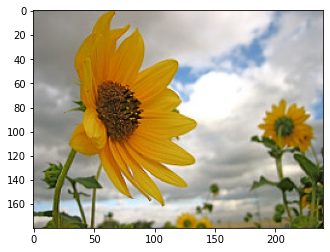

A photo of a car: 1.91%
A photo: 98.09%

exercise2_images/imagen158.jpg


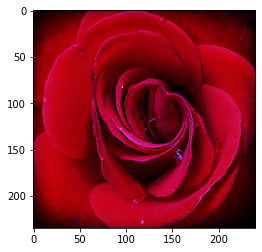

A photo of a car: 2.06%
A photo: 97.94%

exercise2_images/imagen159.jpg


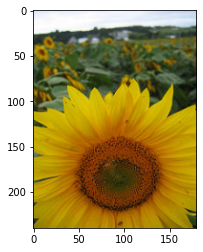

A photo of a car: 1.12%
A photo: 98.88%

exercise2_images/imagen177.jpg


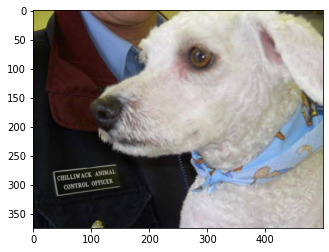

A photo of a car: 0.33%
A photo: 99.67%

exercise2_images/imagen18.jpg


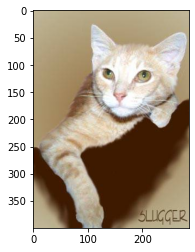

A photo of a car: 0.42%
A photo: 99.58%

exercise2_images/imagen181.jpg


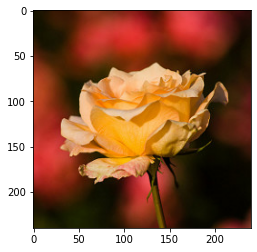

A photo of a car: 0.62%
A photo: 99.38%

exercise2_images/imagen182.jpg


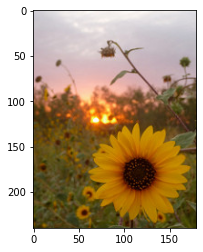

A photo of a car: 1.42%
A photo: 98.58%

exercise2_images/imagen183.jpg


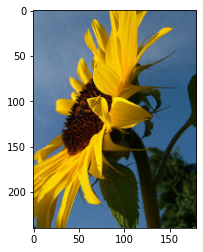

A photo of a car: 0.97%
A photo: 99.03%

exercise2_images/imagen184.jpg


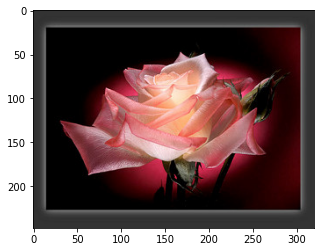

A photo of a car: 1.84%
A photo: 98.16%

exercise2_images/imagen185.jpg


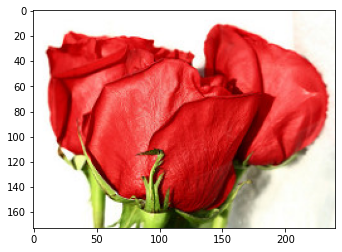

A photo of a car: 0.21%
A photo: 99.79%

exercise2_images/imagen186.jpg


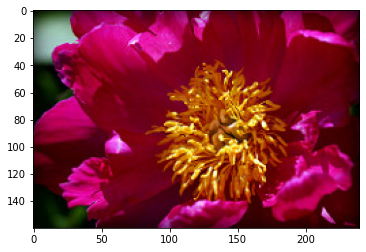

A photo of a car: 0.40%
A photo: 99.60%

exercise2_images/imagen196.jpg


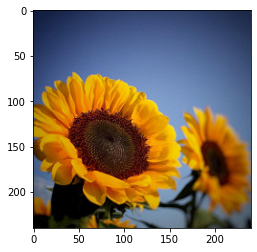

A photo of a car: 1.61%
A photo: 98.39%

exercise2_images/imagen197.jpg


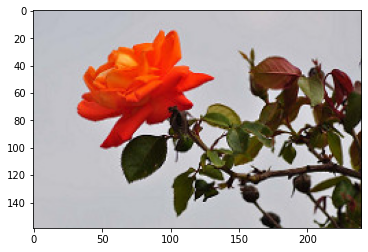

A photo of a car: 0.59%
A photo: 99.41%

exercise2_images/imagen200.jpg


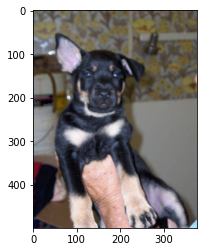

A photo of a car: 0.30%
A photo: 99.70%

exercise2_images/imagen201.jpg


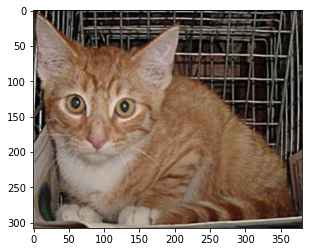

A photo of a car: 1.42%
A photo: 98.58%

exercise2_images/imagen203.jpg


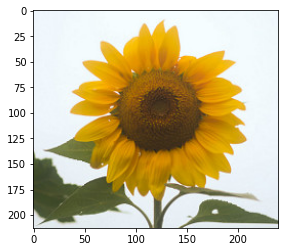

A photo of a car: 0.84%
A photo: 99.16%

exercise2_images/imagen204.jpg


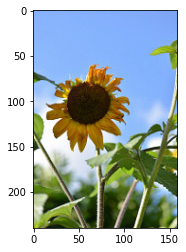

A photo of a car: 0.48%
A photo: 99.52%

exercise2_images/imagen213.jpg


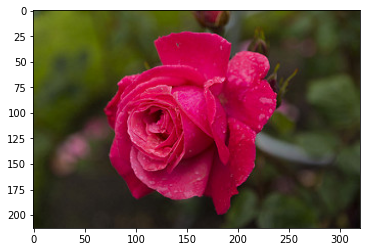

A photo of a car: 0.97%
A photo: 99.03%

exercise2_images/imagen220.jpg


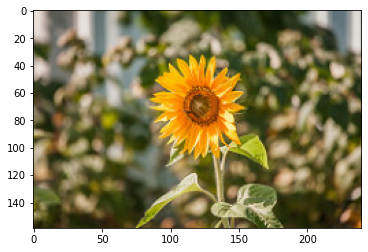

A photo of a car: 1.09%
A photo: 98.91%

exercise2_images/imagen260.jpg


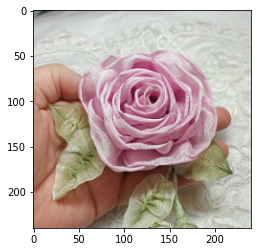

A photo of a car: 0.40%
A photo: 99.60%

exercise2_images/imagen261.jpg


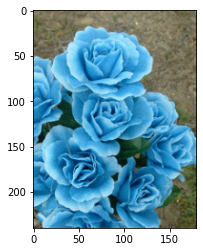

A photo of a car: 0.37%
A photo: 99.63%

exercise2_images/imagen266.jpg


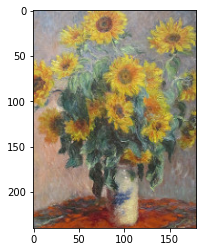

A photo of a car: 1.61%
A photo: 98.39%

exercise2_images/imagen270.jpg


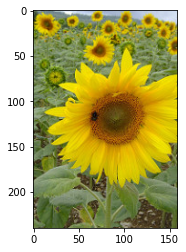

A photo of a car: 0.81%
A photo: 99.19%

exercise2_images/imagen292.jpeg


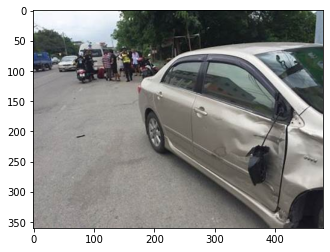

A photo of a car: 98.99%
A photo: 1.01%

exercise2_images/imagen376.jpg


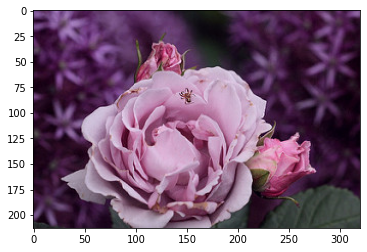

A photo of a car: 0.25%
A photo: 99.75%

exercise2_images/imagen379.jpg


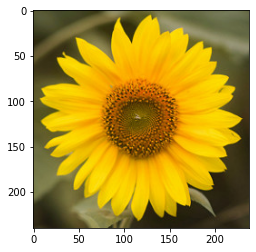

A photo of a car: 2.81%
A photo: 97.19%

exercise2_images/imagen382.jpg


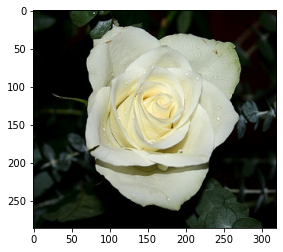

A photo of a car: 0.20%
A photo: 99.80%

exercise2_images/imagen484.jpg


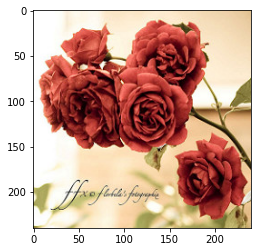

A photo of a car: 0.20%
A photo: 99.80%

exercise2_images/imagen558.jpg


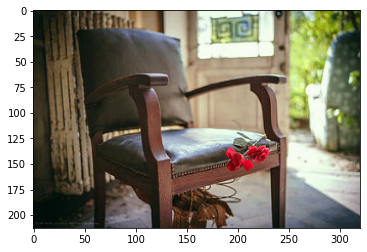

A photo of a car: 0.87%
A photo: 99.13%

exercise2_images/imagen594.jpg


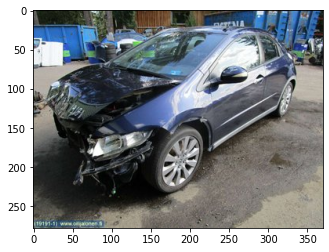

A photo of a car: 97.66%
A photo: 2.34%

exercise2_images/imagen748.jpg


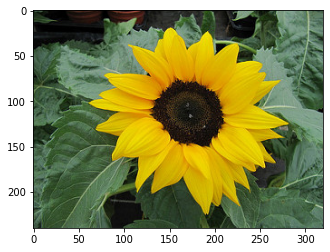

A photo of a car: 0.84%
A photo: 99.16%

exercise2_images/imagen750.jpg


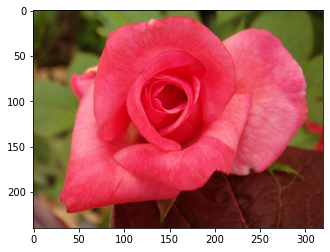

A photo of a car: 0.33%
A photo: 99.67%

exercise2_images/imagen754.jpg


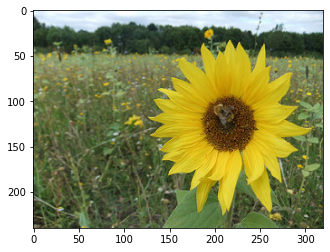

A photo of a car: 1.25%
A photo: 98.75%

exercise2_images/imagen755.jpg


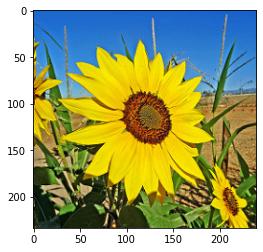

A photo of a car: 1.71%
A photo: 98.29%

exercise2_images/imagen763.jpg


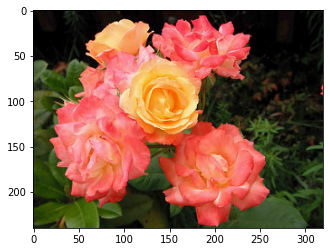

A photo of a car: 0.14%
A photo: 99.86%

exercise2_images/imagen911.jpg


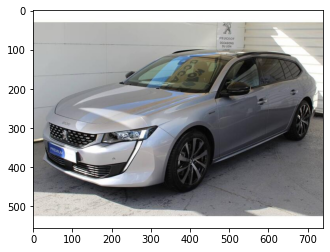

A photo of a car: 97.82%
A photo: 2.18%

exercise2_images/imagen941.jpg


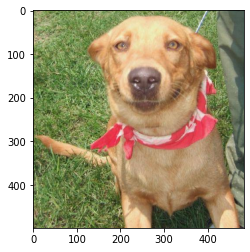

A photo of a car: 0.95%
A photo: 99.05%

exercise2_images/imagen993.jpg


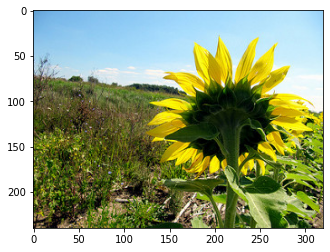

A photo of a car: 0.78%
A photo: 99.22%

exercise2_images/imagen994.jpg


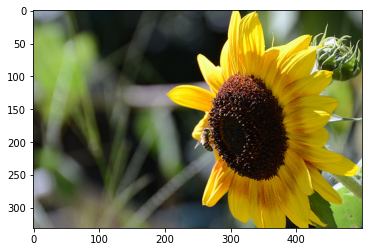

A photo of a car: 1.23%
A photo: 98.77%

exercise2_images/imagen995.jpeg


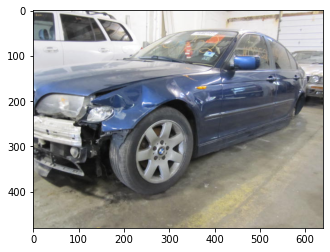

A photo of a car: 98.03%
A photo: 1.97%

exercise2_images/imagen996.jpg


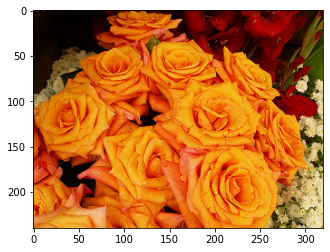

A photo of a car: 0.24%
A photo: 99.76%



In [14]:
labels = ["A photo of a car", "A photo"]
text = clip.tokenize(labels).to(device)

# Calculate features (only for the text, since we have the same image)
with torch.no_grad():
    text_features = model.encode_text(text)

text_features /= text_features.norm(dim=-1, keepdim=True)

# Compute similarity
similarity = image_features @ text_features.T

probabilities = (100.*similarity).softmax(dim=-1)

for image_path in image_paths:
    print(image_path)
    plt.imshow(plt.imread(image_path))
    plt.show()

    for i in range(len(labels)):
        print(f"{labels[i]}: {100* probabilities[image_paths.index(image_path), i].item():.2f}%")

    print()

**c)** Without printing any photo, could you tell if there were any person's face in the photos?

In [16]:
labels = ["A photo of a person's face", "A photo"]
text = clip.tokenize(labels).to(device)

# Calculate features (only for the text, since we have the same image)
with torch.no_grad():
    text_features = model.encode_text(text)

text_features /= text_features.norm(dim=-1, keepdim=True)

# Compute similarity
similarity = image_features @ text_features.T

probabilities = (100.*similarity).softmax(dim=-1)

In [20]:
probabilities.argmax(dim=1)

tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])